# Operaciones básicas con imágenes y transformaciones iniciales

**Duración estimada:** 80 minutos

## Objetivo

Este cuaderno preserva la autonomía del material original y usa la imagen `small-boats_1.jpg` para recorrer operaciones básicas con OpenCV. La idea es trabajar sobre una sola imagen y ver, paso a paso, qué pasa cuando recortamos, redimensionamos, mejoramos, segmentamos o transformamos.

## Resultados de aprendizaje

Al final vas a poder:

- leer una imagen digital como una matriz de píxeles;
- recortar, redimensionar, rotar y voltear imágenes;
- aplicar ajustes básicos de brillo, contraste y suavizado;
- detectar bordes y realizar segmentación simple;
- probar transformaciones afines y de perspectiva en un nivel introductorio.


## 1. ¿Qué es una imagen digital?

Una imagen digital está compuesta por pequeños cuadrados llamados **píxeles**. Cada píxel guarda información de color. Si organizamos todos esos valores en filas y columnas, obtenemos una matriz. Por eso en OpenCV una imagen se puede tratar como una tabla de números.


Forma de la imagen: (795, 1200, 3)
Alto: 795
Ancho: 1200


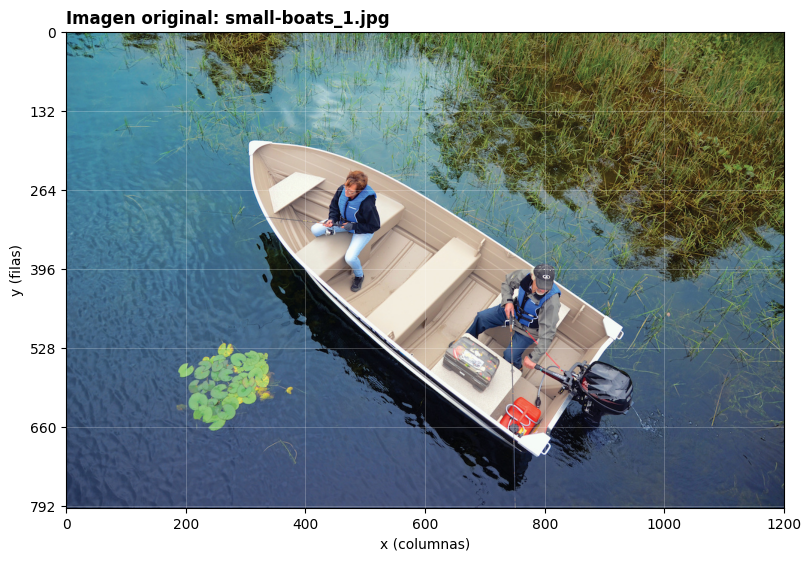

In [1]:
from pathlib import Path
import urllib.request

import cv2
import numpy as np
import matplotlib.pyplot as plt


CARPETA_IMAGENES = Path("Imagenes")
CARPETA_IMAGENES.mkdir(exist_ok=True)


def preparar_eje_imagen(eje, imagen, titulo, mapa=None):
    """Muestra una imagen con ejes visibles para leer coordenadas."""
    eje.imshow(imagen, cmap=mapa)
    eje.set_title(titulo, loc="left", fontweight="bold")
    eje.set_xlabel("x (columnas)")
    eje.set_ylabel("y (filas)")

    if imagen.ndim == 2:
        alto, ancho = imagen.shape
    else:
        alto, ancho = imagen.shape[:2]

    paso_x = max(50, ancho // 6)
    paso_y = max(50, alto // 6)
    eje.set_xticks(np.arange(0, ancho + 1, paso_x))
    eje.set_yticks(np.arange(0, alto + 1, paso_y))
    eje.grid(color="white", alpha=0.25, linewidth=0.6)


def mostrar_una_imagen(imagen, titulo, mapa=None, tamano=(8, 6)):
    figura, eje = plt.subplots(figsize=tamano, constrained_layout=True)
    preparar_eje_imagen(eje, imagen, titulo, mapa)
    plt.show()


def mostrar_varias_imagenes(imagenes, titulos, mapas=None, tamano=(15, 5)):
    if mapas is None:
        mapas = [None] * len(imagenes)

    figura, ejes = plt.subplots(1, len(imagenes), figsize=tamano, constrained_layout=True)
    if len(imagenes) == 1:
        ejes = [ejes]

    for eje, imagen, titulo, mapa in zip(ejes, imagenes, titulos, mapas):
        preparar_eje_imagen(eje, imagen, titulo, mapa)

    plt.show()

ruta_small_boats = CARPETA_IMAGENES / "small-boats_1.jpg"
url_small_boats = "https://www.discoverboating.com/sites/default/files/small-boats_1.jpg"

if not ruta_small_boats.exists():
    print("La imagen no está en la carpeta local. La descargamos desde la fuente original.")
    urllib.request.urlretrieve(url_small_boats, ruta_small_boats)

imagen_bgr = cv2.imread(str(ruta_small_boats), cv2.IMREAD_COLOR)
imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)

alto, ancho = imagen_rgb.shape[:2]

print("Forma de la imagen:", imagen_rgb.shape)
print("Alto:", alto)
print("Ancho:", ancho)

mostrar_una_imagen(imagen_rgb, "Imagen original: small-boats_1.jpg")


## 2. Operaciones básicas con imágenes

En esta parte vamos a trabajar con operaciones muy concretas: recortar, cambiar tamaño, girar y voltear. Son acciones simples, pero ayudan mucho a entender cómo se manipula una imagen desde el código.


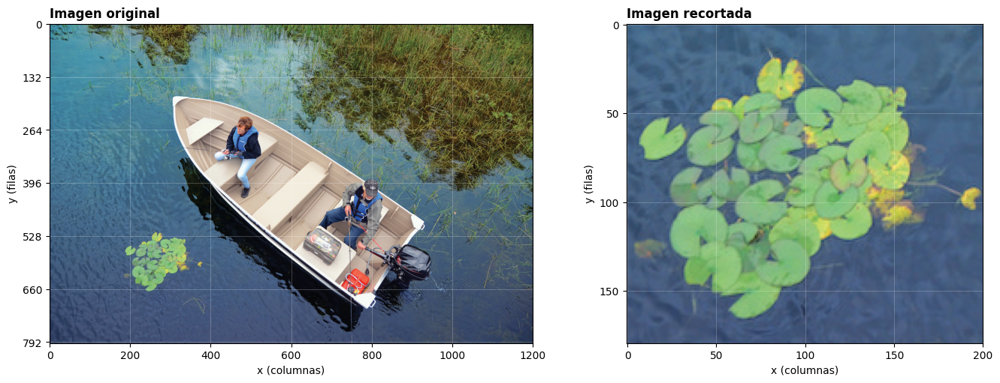

In [2]:
# Recorte: primero va y (filas), después x (columnas).
fila_inicial = 500
fila_final = 680
columna_inicial = 180
columna_final = 380

imagen_recortada = imagen_rgb[fila_inicial:fila_final, columna_inicial:columna_final]

mostrar_varias_imagenes(
    [imagen_rgb, imagen_recortada],
    ["Imagen original", "Imagen recortada"],
    tamano=(14, 5),
)


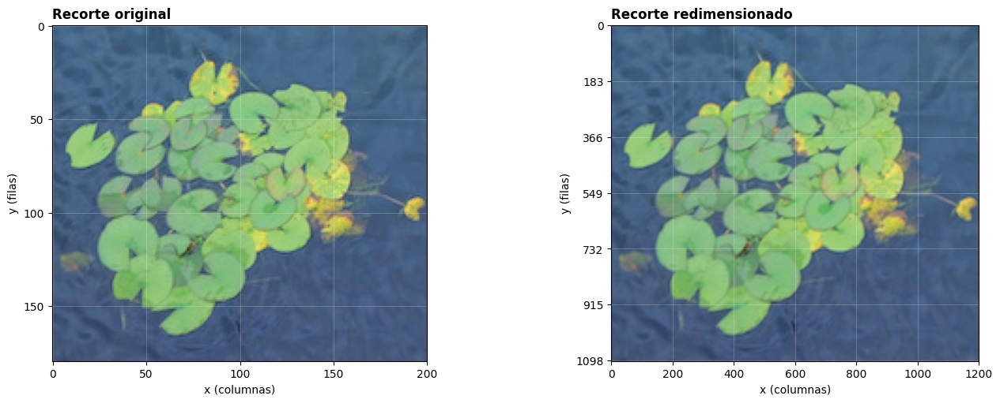

In [3]:
# Redimensión del recorte.
imagen_redimensionada = cv2.resize(imagen_recortada, (1200, 1100))

mostrar_varias_imagenes(
    [imagen_recortada, imagen_redimensionada],
    ["Recorte original", "Recorte redimensionado"],
    tamano=(14, 5),
)


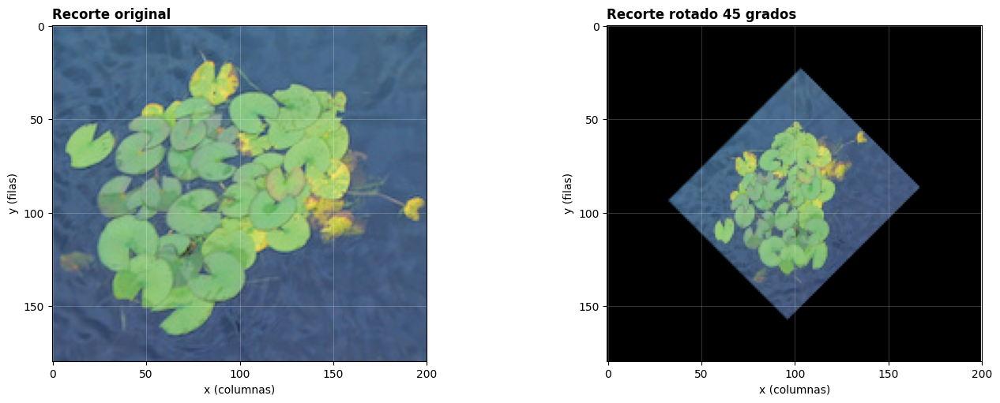

In [4]:
# Rotación del recorte.
alto_recorte, ancho_recorte = imagen_recortada.shape[:2]
centro_recorte = (ancho_recorte / 2, alto_recorte / 2)

matriz_rotacion = cv2.getRotationMatrix2D(centro_recorte, 45, 0.5)
imagen_rotada = cv2.warpAffine(imagen_recortada, matriz_rotacion, (ancho_recorte, alto_recorte))

mostrar_varias_imagenes(
    [imagen_recortada, imagen_rotada],
    ["Recorte original", "Recorte rotado 45 grados"],
    tamano=(14, 5),
)


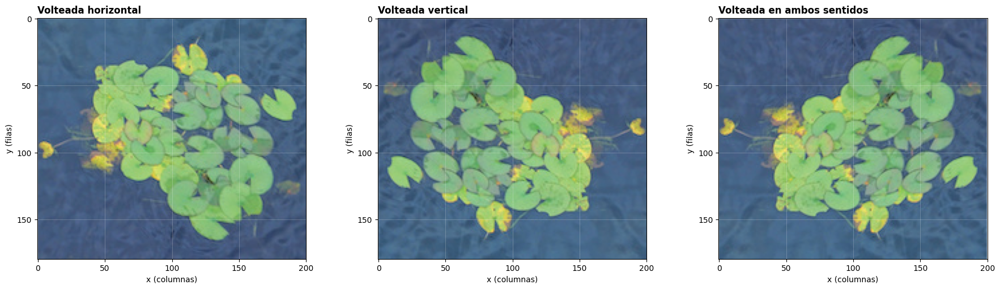

In [5]:
# Volteos.
imagen_volteada_horizontal = cv2.flip(imagen_recortada, 1)
imagen_volteada_vertical = cv2.flip(imagen_recortada, 0)
imagen_volteada_ambos = cv2.flip(imagen_recortada, -1)

mostrar_varias_imagenes(
    [imagen_volteada_horizontal, imagen_volteada_vertical, imagen_volteada_ambos],
    ["Volteada horizontal", "Volteada vertical", "Volteada en ambos sentidos"],
    tamano=(18, 5),
)


## 3. Mejora de la imagen

Ahora pasamos a cambios que afectan la apariencia: brillo, contraste, suavizado y bordes. Son operaciones muy comunes cuando queremos preparar una imagen para análisis posterior.


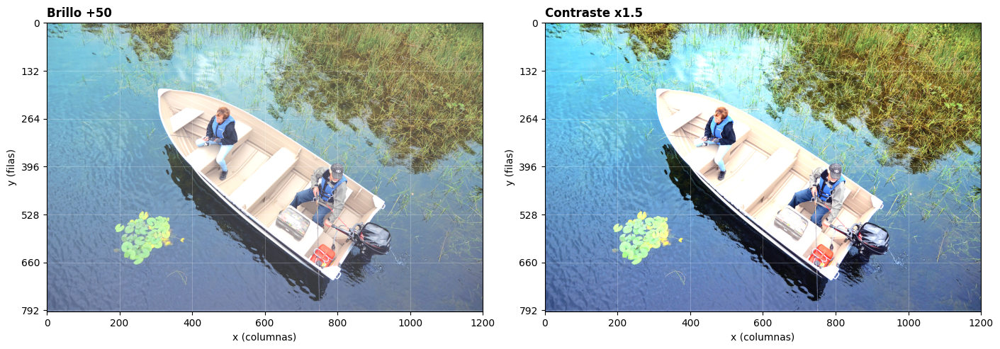

In [6]:
def ajustar_brillo_contraste(imagen_rgb, brillo=0, contraste=1.0):
    """Ajusta brillo y contraste usando la función de OpenCV."""
    imagen_ajustada = cv2.convertScaleAbs(imagen_rgb, alpha=contraste, beta=brillo)
    return imagen_ajustada


imagen_brillo_mas_50 = ajustar_brillo_contraste(imagen_rgb, brillo=50)
imagen_contraste_x1_5 = ajustar_brillo_contraste(imagen_rgb, contraste=1.5)

mostrar_varias_imagenes(
    [imagen_brillo_mas_50, imagen_contraste_x1_5],
    ["Brillo +50", "Contraste x1.5"],
    tamano=(14, 5),
)


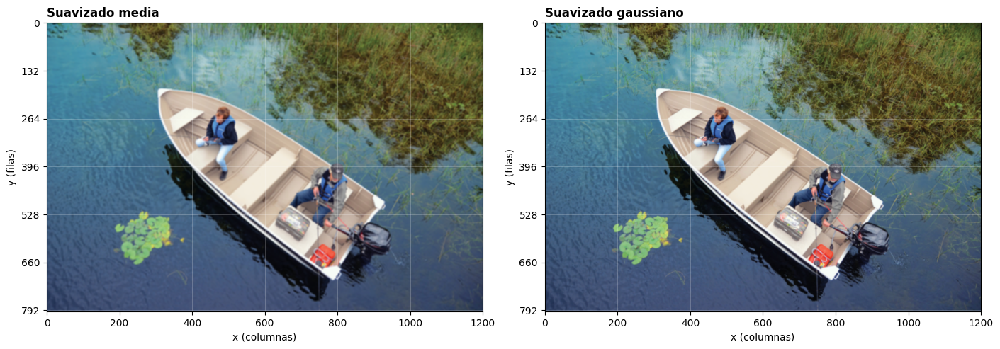

In [7]:
imagen_suavizada_media = cv2.blur(imagen_rgb, (5, 5))
imagen_suavizada_gaussiana = cv2.GaussianBlur(imagen_rgb, (5, 5), 0)

mostrar_varias_imagenes(
    [imagen_suavizada_media, imagen_suavizada_gaussiana],
    ["Suavizado media", "Suavizado gaussiano"],
    tamano=(14, 5),
)


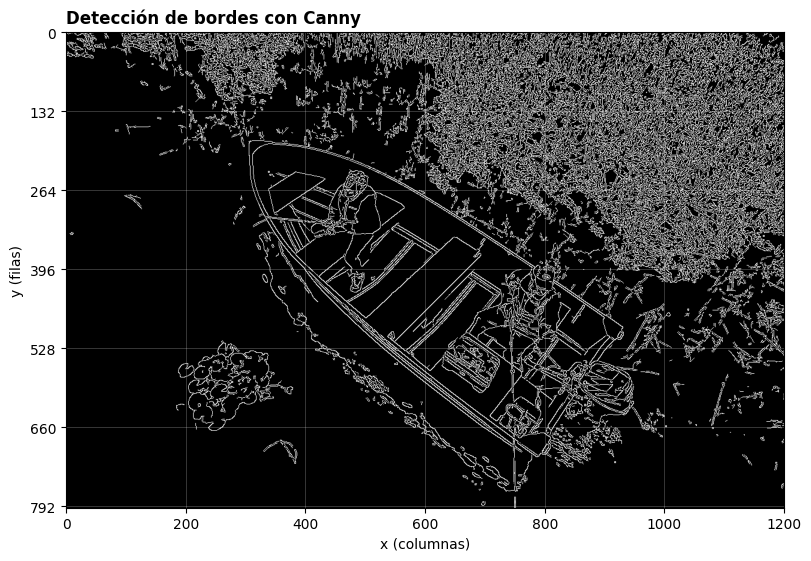

In [8]:
imagen_gris = cv2.cvtColor(imagen_rgb, cv2.COLOR_RGB2GRAY)
imagen_bordes_canny = cv2.Canny(imagen_gris, 100, 200)

mostrar_una_imagen(imagen_bordes_canny, "Detección de bordes con Canny", mapa="gray")


## 4. Segmentación de la imagen

Segmentar una imagen significa separarla en regiones de interés. Acá vamos a hacer dos ejemplos simples: umbralización en grises y segmentación por color en `HSV`.


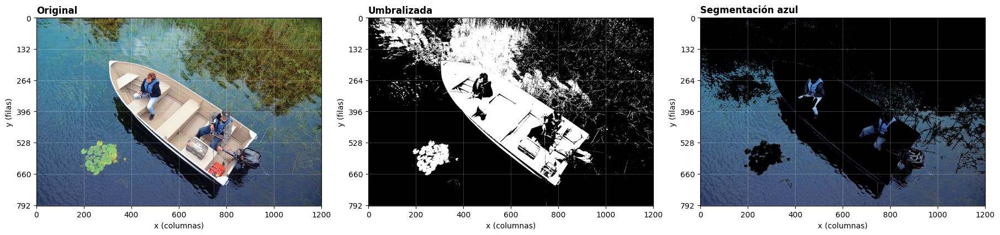

In [9]:
_, imagen_umbralizada = cv2.threshold(imagen_gris, 128, 255, cv2.THRESH_BINARY)

imagen_hsv = cv2.cvtColor(imagen_rgb, cv2.COLOR_RGB2HSV)
limite_inferior_azul = np.array([100, 50, 50])
limite_superior_azul = np.array([130, 255, 255])
mascara_azul = cv2.inRange(imagen_hsv, limite_inferior_azul, limite_superior_azul)
imagen_segmentada_azul = cv2.bitwise_and(imagen_rgb, imagen_rgb, mask=mascara_azul)

mostrar_varias_imagenes(
    [imagen_rgb, imagen_umbralizada, imagen_segmentada_azul],
    ["Original", "Umbralizada", "Segmentación azul"],
    [None, "gray", None],
    tamano=(18, 5),
)


## 5. Transformaciones geométricas

Esta parte reúne varias transformaciones muy básicas para explorar cómo cambia la imagen cuando modificamos su tamaño, posición o perspectiva. Más adelante hay un cuaderno específico que profundiza en perspectiva de forma mucho más cuidada.


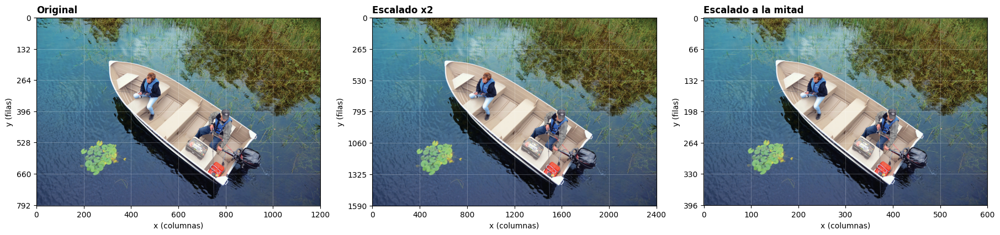

In [10]:
imagen_escalada_x2 = cv2.resize(imagen_rgb, (ancho * 2, alto * 2))
imagen_escalada_mitad = cv2.resize(imagen_rgb, (ancho // 2, alto // 2))

mostrar_varias_imagenes(
    [imagen_rgb, imagen_escalada_x2, imagen_escalada_mitad],
    ["Original", "Escalado x2", "Escalado a la mitad"],
    tamano=(18, 5),
)


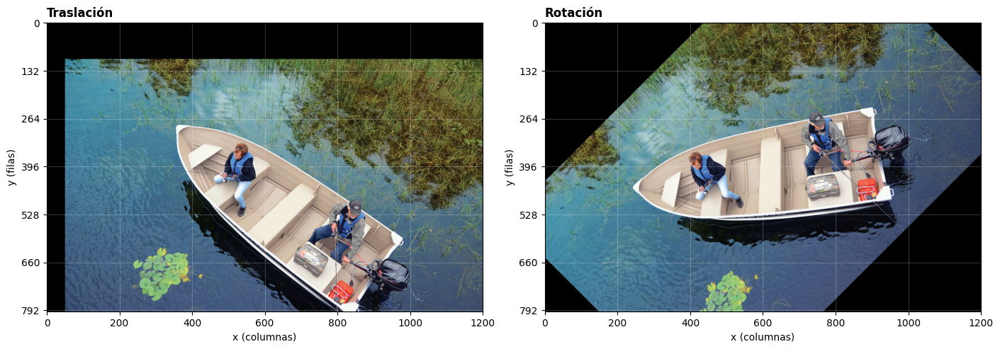

In [11]:
matriz_traslacion = np.float32([[1, 0, 50], [0, 1, 100]])
imagen_trasladada = cv2.warpAffine(imagen_rgb, matriz_traslacion, (ancho, alto))

matriz_rotacion_completa = cv2.getRotationMatrix2D((ancho / 2, alto / 2), 45, 1.0)
imagen_rotada_completa = cv2.warpAffine(imagen_rgb, matriz_rotacion_completa, (ancho, alto))

mostrar_varias_imagenes(
    [imagen_trasladada, imagen_rotada_completa],
    ["Traslación", "Rotación"],
    tamano=(14, 5),
)


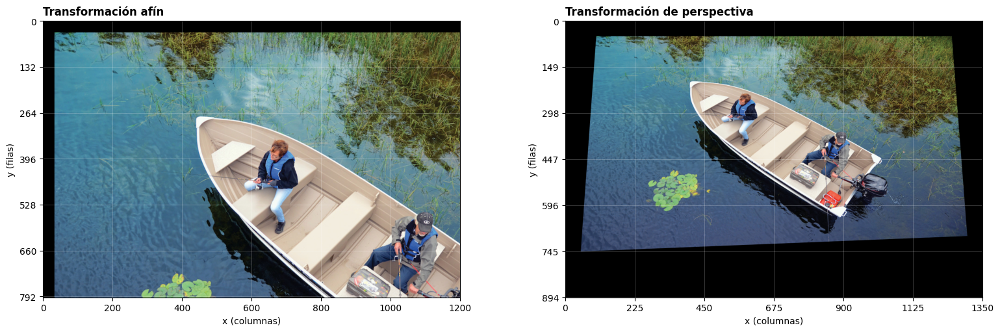

In [12]:
puntos_originales = np.float32([[50, 50], [200, 50], [50, 200]])
puntos_destino = np.float32([[100, 100], [300, 100], [100, 300]])
matriz_afin = cv2.getAffineTransform(puntos_originales, puntos_destino)
imagen_afin = cv2.warpAffine(imagen_rgb, matriz_afin, (ancho, alto))

puntos_originales_perspectiva = np.float32(
    [[0, 0], [ancho - 1, 0], [0, alto - 1], [ancho - 1, alto - 1]]
)
puntos_destino_perspectiva = np.float32(
    [[100, 50], [ancho + 50, 50], [50, alto - 50], [ancho + 100, alto - 100]]
)
matriz_perspectiva = cv2.getPerspectiveTransform(
    puntos_originales_perspectiva,
    puntos_destino_perspectiva,
)
imagen_perspectiva = cv2.warpPerspective(imagen_rgb, matriz_perspectiva, (ancho + 150, alto + 100))

mostrar_varias_imagenes(
    [imagen_afin, imagen_perspectiva],
    ["Transformación afín", "Transformación de perspectiva"],
    tamano=(16, 5),
)


## Cierre

Este cuaderno reúne muchas operaciones de base sobre una sola imagen. Justamente por eso sirve como material autónomo: permite practicar recorte, mejora, segmentación y transformaciones iniciales sin cambiar de ejemplo todo el tiempo.

Si querés profundizar específicamente en perspectiva, el cuaderno `005 - transformaciones geometricas y cambio de perspectiva.ipynb` desarrolla ese tema con mucho más foco.
